# Waymo Train Set Inventory
Quick exploration of the train dataset structure, sequence counts, frame counts, and .npz schema.

In [1]:
import os
import numpy as np
from pathlib import Path
from collections import defaultdict

TRAIN_DIR = Path('../data/processed/waymo_e2e/training/')
print(f"Directory exists: {TRAIN_DIR.exists()}")

Directory exists: True


## 1. NPZ File Count & Sequence Inventory

In [2]:
# Files are flat in training/ — group by sequence prefix (everything before the last underscore+number)
npz_files = sorted(TRAIN_DIR.glob('*.npz'))
print(f"Total .npz files: {len(npz_files):,}")

# Extract sequence IDs
sequences = defaultdict(list)
for f in npz_files:
    parts = f.stem.rsplit('_', 1)
    seq_id = parts[0]
    frame_idx = int(parts[1])
    sequences[seq_id].append(frame_idx)

print(f"Total sequences: {len(sequences):,}")
print(f"\nFirst 5 sequence IDs:")
for k in list(sequences.keys())[:5]:
    print(f"  {k} ({len(sequences[k])} frames)")

Total .npz files: 415,663
Total sequences: 2,037

First 5 sequence IDs:
  003b62820d0e9345eb025de35b046999 (229 frames)
  0042b483892db48907e04dbf69a049f6 (230 frames)
  007083e22896d1fc775a6107ccd0b73e (229 frames)
  00a858a5e34819152ec72183524388c8 (199 frames)
  00f20fd34a1ffd4ced354f04eea88494 (199 frames)


## 2. Frame Counts Per Sequence

In [3]:
frame_counts = [len(v) for v in sequences.values()]
print(f"Frames per sequence:")
print(f"  min:    {min(frame_counts)}")
print(f"  max:    {max(frame_counts)}")
print(f"  mean:   {np.mean(frame_counts):.1f}")
print(f"  median: {np.median(frame_counts):.1f}")

Frames per sequence:
  min:    55
  max:    230
  mean:   204.1
  median: 199.0


## 3. Inspect a Single .npz File

In [4]:
sample_file = npz_files[0]
print(f"Sample file: {sample_file.name}")

data = np.load(sample_file, allow_pickle=True)
print(f"\nTop-level keys: {list(data.keys())}")

Sample file: 003b62820d0e9345eb025de35b046999_10.npz

Top-level keys: ['dataset_name', 'segment_id', 'frame_id', 'timestamp', 'split', 'global_position', 'filename', 'aux_data', 'timestamp_diff', '_modality_data']


In [5]:
modality_data = data['_modality_data'].item()
print(f"Modality keys:")
for key in modality_data.keys():
    val = modality_data[key]
    if hasattr(val, 'shape'):
        print(f"  {key}: shape={val.shape}, dtype={val.dtype}")
    elif isinstance(val, dict):
        print(f"  {key}: dict with keys {list(val.keys())}")
    else:
        print(f"  {key}: {type(val).__name__} = {val}")

Modality keys:
  cameras: shape=(142, 384, 3), dtype=uint8
  intent: Intent = 1
  future_states: Trajectory = Trajectory(N=20, isEmpty=False,             score=None, comps=[X:(20,), IS_VALID:(20,), Y:(20,), Z:(20,), TIMESTAMP:(20,)])
  past_states: Trajectory = Trajectory(N=16, isEmpty=False,             score=None, comps=[X:(16,), IS_VALID:(16,), Y:(16,), VELOCITY_X:(16,), VELOCITY_Y:(16,), ACCELERATION_X:(16,), ACCELERATION_Y:(16,), TIMESTAMP:(16,)])


## 4. Check for Future Trajectory Data

In [6]:
# Spot check a few sequences for future waypoint data
seq_ids = list(sequences.keys())[:5]
for seq_id in seq_ids:
    # Get the last frame in the sequence
    last_frame = max(sequences[seq_id])
    fpath = TRAIN_DIR / f"{seq_id}_{last_frame}.npz"
    d = np.load(fpath, allow_pickle=True)
    md = d['_modality_data'].item()
    future_keys = [k for k in md.keys() if any(x in k.lower() for x in ['future', 'waypoint', 'trajectory'])]
    print(f"{seq_id[:16]}... last_frame={last_frame}, future keys: {future_keys if future_keys else 'NONE'}")

003b62820d0e9345... last_frame=237, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
0042b483892db489... last_frame=237, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
007083e22896d1fc... last_frame=237, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
00a858a5e3481915... last_frame=228, future keys: [<Modality.FUTURE_STATES: 'future_states'>]
00f20fd34a1ffd4c... last_frame=227, future keys: [<Modality.FUTURE_STATES: 'future_states'>]


## 5. Check Available Label/JSON Files

In [8]:
data_dir = Path('../data/')
json_files = list(data_dir.glob('**/*.json'))
print(f"JSON files under data/:")
for f in sorted(json_files):
    print(f"  {f}")

JSON files under data/:
  ../data/bdd100k/labels/100k/test/cabc30fc-e7726578.json
  ../data/bdd100k/labels/100k/test/cabc30fc-eb673c5a.json
  ../data/bdd100k/labels/100k/test/cabc30fc-fd79926f.json
  ../data/bdd100k/labels/100k/test/cabc9045-1b8282ba.json
  ../data/bdd100k/labels/100k/test/cabc9045-581f64de.json
  ../data/bdd100k/labels/100k/test/cabc9045-5a50690f.json
  ../data/bdd100k/labels/100k/test/cabc9045-b3349548.json
  ../data/bdd100k/labels/100k/test/cabc9045-c6dc9529.json
  ../data/bdd100k/labels/100k/test/cabc9045-cd422b81.json
  ../data/bdd100k/labels/100k/test/cabc9045-d91ecb66.json
  ../data/bdd100k/labels/100k/test/cabddb96-ca0ac856.json
  ../data/bdd100k/labels/100k/test/cabe1040-5f02711e.json
  ../data/bdd100k/labels/100k/test/cabe1040-c59cb390.json
  ../data/bdd100k/labels/100k/test/cabea010-6882cf41.json
  ../data/bdd100k/labels/100k/test/cabf7be1-36a39a28.json
  ../data/bdd100k/labels/100k/test/cabf7be1-f1a7e00d.json
  ../data/bdd100k/labels/100k/test/cabf9f3c-d58a

SCRATCH

In [10]:
# --- TEMP DIAGNOSTIC: turn-direction branch consistency ---
# Measures how many sequences hit the sharp-turn branch (dot/(mag1*mag2) < -0.3)
# and how many would flip left<->right if we switched that branch from
# `ys[-1] > 0` to `angle > 0`. Delete this cell after reading the result.

import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import numpy as np
from collections import defaultdict, Counter
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '../data/processed/waymo_e2e/training/'
files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])

# group frames by sequence
sequences = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_', 1)[0]
    sequences[seq_id].append(fname)

MANEUVER_RANK = {
    'left-turn': 5, 'right-turn': 5,
    'lane-change-left': 4, 'lane-change-right': 4,
    'straight': 3, 'stationary': 1,
}

def analyze_frame(xs, ys):
    """Returns (in_sharp_branch, ys_decision, angle_decision) or None if stationary."""
    total_dist = np.sqrt((xs[-1] - xs[0])**2 + (ys[-1] - ys[0])**2)
    if total_dist < 2.0:
        return None
    n = len(xs); mid = n // 2
    dx1, dy1 = xs[mid] - xs[0], ys[mid] - ys[0]
    dx2, dy2 = xs[-1] - xs[mid], ys[-1] - ys[mid]
    mag1 = np.sqrt(dx1**2 + dy1**2)
    mag2 = np.sqrt(dx2**2 + dy2**2)
    if mag1 < 0.1 or mag2 < 0.1:
        return None
    cross = dx1 * dy2 - dy1 * dx2
    dot = dx1 * dx2 + dy1 * dy2
    cos_a = dot / (mag1 * mag2)
    angle = np.arctan2(cross / (mag1 * mag2), cos_a) * 180 / np.pi

    in_sharp = cos_a < -0.3
    ys_dec = 'left-turn' if ys[-1] > 0 else 'right-turn'
    angle_dec = 'left-turn' if angle > 0 else 'right-turn'
    return (in_sharp, ys_dec, angle_dec)

sharp_frames = 0
sharp_disagree_frames = 0
seqs_with_sharp = set()
seqs_that_flip = set()

for seq_id, fnames in sequences.items():
    for fname in fnames:
        data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
        modality = data['_modality_data'].item()
        future = modality[Modality.FUTURE_STATES]
        if future.isEmpty:
            continue
        xs = future.get(TrajectoryComponent.X).flatten()
        ys = future.get(TrajectoryComponent.Y).flatten()
        result = analyze_frame(xs, ys)
        if result is None:
            continue
        in_sharp, ys_dec, angle_dec = result
        if in_sharp:
            sharp_frames += 1
            seqs_with_sharp.add(seq_id)
            if ys_dec != angle_dec:
                sharp_disagree_frames += 1
                seqs_that_flip.add(seq_id)

print(f'Total sequences:                        {len(sequences):,}')
print(f'Frames hitting sharp-turn branch:       {sharp_frames:,}')
print(f'  of those, where ys vs angle disagree: {sharp_disagree_frames:,}')
print(f'Sequences with any sharp-branch frame:  {len(seqs_with_sharp):,}')
print(f'Sequences with a disagreeing frame:     {len(seqs_that_flip):,}')

Total sequences:                        2,037
Frames hitting sharp-turn branch:       355
  of those, where ys vs angle disagree: 233
Sequences with any sharp-branch frame:  46
Sequences with a disagreeing frame:     40


Sequences whose LABEL actually flips: 26


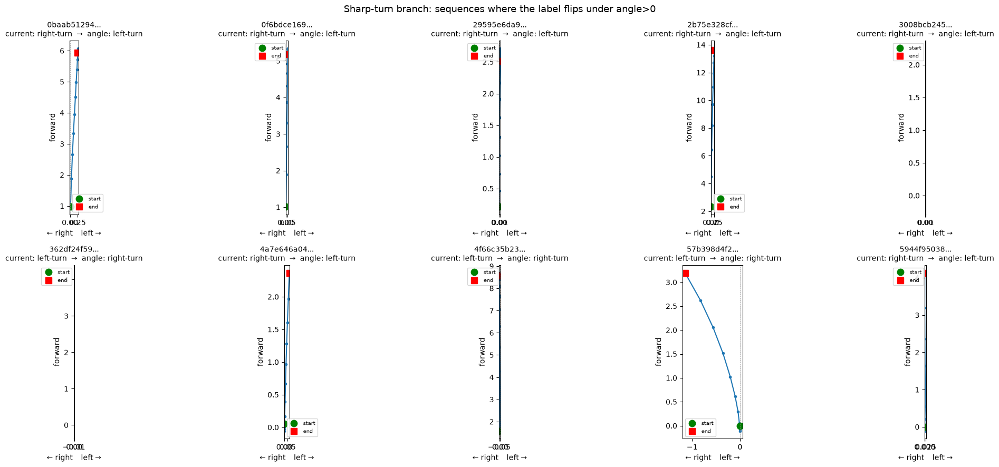

In [12]:
# --- SPOT CHECK: trajectory plots for sequences where the sharp-turn branch
# would flip left<->right. Shows current label (ys[-1]) vs proposed (angle). ---
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '../data/processed/waymo_e2e/training/'
files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])

sequences = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_', 1)[0]
    frame_idx = int(fname.rsplit('_', 1)[1].replace('.npz', ''))
    sequences[seq_id].append((frame_idx, fname))
for sid in sequences:
    sequences[sid].sort(key=lambda x: x[0])

MANEUVER_RANK = {'left-turn': 5, 'right-turn': 5, 'lane-change-left': 4,
                 'lane-change-right': 4, 'straight': 3, 'stationary': 1}

def classify_detailed(xs, ys):
    """Returns (maneuver_current, maneuver_angle, in_sharp) using the two criteria."""
    total_dist = np.sqrt((xs[-1]-xs[0])**2 + (ys[-1]-ys[0])**2)
    if total_dist < 2.0:
        return 'stationary', 'stationary', False
    n = len(xs); mid = n // 2
    dx1, dy1 = xs[mid]-xs[0], ys[mid]-ys[0]
    dx2, dy2 = xs[-1]-xs[mid], ys[-1]-ys[mid]
    mag1 = np.sqrt(dx1**2+dy1**2); mag2 = np.sqrt(dx2**2+dy2**2)
    if mag1 < 0.1 or mag2 < 0.1:
        return 'stationary', 'stationary', False
    cross = dx1*dy2 - dy1*dx2
    dot = dx1*dx2 + dy1*dy2
    cos_a = dot/(mag1*mag2)
    angle = np.arctan2(cross/(mag1*mag2), cos_a) * 180/np.pi
    in_sharp = cos_a < -0.3
    if in_sharp:
        cur = 'left-turn' if ys[-1] > 0 else 'right-turn'      # current logic
        new = 'left-turn' if angle > 0 else 'right-turn'       # proposed
        return cur, new, True
    elif abs(angle) < 8:
        return 'straight', 'straight', False
    elif abs(angle) < 20:
        m = 'lane-change-left' if angle > 0 else 'lane-change-right'
        return m, m, False
    else:
        m = 'left-turn' if angle > 0 else 'right-turn'
        return m, m, False

# find sequences whose BEST frame is a sharp-branch frame that disagrees
flip_seqs = []
for seq_id, frames in sequences.items():
    best_rank = -1; best = None
    for frame_idx, fname in frames:
        data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
        modality = data['_modality_data'].item()
        future = modality[Modality.FUTURE_STATES]
        if future.isEmpty:
            continue
        xs = future.get(TrajectoryComponent.X).flatten()
        ys = future.get(TrajectoryComponent.Y).flatten()
        cur, new, in_sharp = classify_detailed(xs, ys)
        rank = MANEUVER_RANK[cur]
        if rank > best_rank:
            best_rank = rank
            best = (fname, xs, ys, cur, new, in_sharp)
    if best and best[5] and best[3] != best[4]:   # best frame is sharp AND flips
        flip_seqs.append((seq_id, best))

print(f'Sequences whose LABEL actually flips: {len(flip_seqs)}')

# plot up to 10
n_plot = min(10, len(flip_seqs))
fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()
for ax, (seq_id, (fname, xs, ys, cur, new, _)) in zip(axes, flip_seqs[:n_plot]):
    # vehicle frame: +y = left, +x = forward. Plot y horizontal (flipped) so left is left.
    ax.plot(-ys, xs, '-o', ms=3)
    ax.plot(-ys[0], xs[0], 'go', ms=9, label='start')
    ax.plot(-ys[-1], xs[-1], 'rs', ms=9, label='end')
    ax.axvline(0, color='gray', lw=0.5, ls='--')
    ax.set_title(f'{seq_id[:10]}...\ncurrent: {cur}  →  angle: {new}', fontsize=10)
    ax.set_xlabel('← right    left →'); ax.set_ylabel('forward')
    ax.set_aspect('equal', 'box'); ax.legend(fontsize=7)
for ax in axes[n_plot:]:
    ax.axis('off')
plt.suptitle('Sharp-turn branch: sequences where the label flips under angle>0', fontsize=13)
plt.tight_layout()
plt.savefig('outputs/turn_branch_spotcheck.png', dpi=130)
plt.show()

In [13]:
# --- Magnitude profile of the 26 flipping sequences ---
# Prints lateral displacement, heading change, cos_a for each so we can
# set a principled magnitude floor on the sharp-turn branch.
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import numpy as np
from collections import defaultdict
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '../data/processed/waymo_e2e/training/'
files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])
sequences = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_', 1)[0]
    frame_idx = int(fname.rsplit('_', 1)[1].replace('.npz', ''))
    sequences[seq_id].append((frame_idx, fname))
for sid in sequences:
    sequences[sid].sort(key=lambda x: x[0])

MANEUVER_RANK = {'left-turn': 5, 'right-turn': 5, 'lane-change-left': 4,
                 'lane-change-right': 4, 'straight': 3, 'stationary': 1}

def profile(xs, ys):
    total_dist = np.sqrt((xs[-1]-xs[0])**2 + (ys[-1]-ys[0])**2)
    lateral = ys[-1] - ys[0]            # signed lateral displacement
    forward = xs[-1] - xs[0]
    n = len(xs); mid = n // 2
    dx1, dy1 = xs[mid]-xs[0], ys[mid]-ys[0]
    dx2, dy2 = xs[-1]-xs[mid], ys[-1]-ys[mid]
    mag1 = np.sqrt(dx1**2+dy1**2); mag2 = np.sqrt(dx2**2+dy2**2)
    if mag1 < 0.1 or mag2 < 0.1:
        return None
    cross = dx1*dy2 - dy1*dx2
    dot = dx1*dx2 + dy1*dy2
    cos_a = dot/(mag1*mag2)
    angle = np.arctan2(cross/(mag1*mag2), cos_a) * 180/np.pi
    return dict(total_dist=total_dist, lateral=lateral, forward=forward,
               cos_a=cos_a, angle=angle)

# reproduce the label-setting frame per sequence, flag the sharp flippers
rows = []
for seq_id, frames in sequences.items():
    best_rank = -1; best = None
    for _, fname in frames:
        data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
        modality = data['_modality_data'].item()
        future = modality[Modality.FUTURE_STATES]
        if future.isEmpty:
            continue
        xs = future.get(TrajectoryComponent.X).flatten()
        ys = future.get(TrajectoryComponent.Y).flatten()
        p = profile(xs, ys)
        if p is None:
            continue
        # replicate current labeling to find best frame
        if p['total_dist'] < 2.0:
            cur = 'stationary'
        elif p['cos_a'] < -0.3:
            cur = 'left-turn' if ys[-1] > 0 else 'right-turn'
        elif abs(p['angle']) < 8:
            cur = 'straight'
        elif abs(p['angle']) < 20:
            cur = 'lane-change-left' if p['angle'] > 0 else 'lane-change-right'
        else:
            cur = 'left-turn' if p['angle'] > 0 else 'right-turn'
        if MANEUVER_RANK[cur] > best_rank:
            best_rank = MANEUVER_RANK[cur]
            best = (cur, p, ys[-1])
    if best is None:
        continue
    cur, p, ylast = best
    if p['cos_a'] < -0.3:  # best frame is a sharp-branch frame
        new = 'left-turn' if p['angle'] > 0 else 'right-turn'
        if cur != new:
            rows.append((seq_id, cur, new, p, ylast))

print(f'{"seq":<12}{"current":>16}{"angle":>12}{"|lat|(m)":>10}{"fwd(m)":>9}{"heading°":>10}{"cos_a":>8}')
print('-'*80)
for seq_id, cur, new, p, ylast in sorted(rows, key=lambda r: abs(r[3]['lateral'])):
    print(f'{seq_id[:10]:<12}{cur:>16}{new:>12}{abs(p["lateral"]):>10.3f}'
          f'{p["forward"]:>9.2f}{p["angle"]:>10.1f}{p["cos_a"]:>8.2f}')

seq                  current       angle  |lat|(m)   fwd(m)  heading°   cos_a
--------------------------------------------------------------------------------
dde512e476         left-turn  right-turn     0.004     4.29    -179.4   -1.00
c4d2a1c09c        right-turn   left-turn     0.007     2.11     178.8   -1.00
d87ebc39f6         left-turn  right-turn     0.008     2.35    -179.3   -1.00
c97cabae55        right-turn   left-turn     0.010     2.20     178.0   -1.00
3008bcb245        right-turn   left-turn     0.011     2.25     179.4   -1.00
feecefad9b        right-turn   left-turn     0.013     6.40     179.7   -1.00
29595e6da9        right-turn   left-turn     0.013     2.30     178.8   -1.00
362df24f59         left-turn  right-turn     0.014     4.18    -180.0   -1.00
5eeea0e74f        right-turn   left-turn     0.015     3.45     178.7   -1.00
b445bc3004        right-turn   left-turn     0.016     3.07     179.4   -1.00
8babe36c1e        right-turn   left-turn     0.032     4.98  

Sequence 7e65cbe0cdb38fb5604ea173f5b95564, 199 frames
Best frame: 7e65cbe0cdb38fb5604ea173f5b95564_30.npz
  current label: right-turn
  lateral disp: -0.847 m,  forward disp: +9.700 m
  ratio |lat|/fwd: 0.087


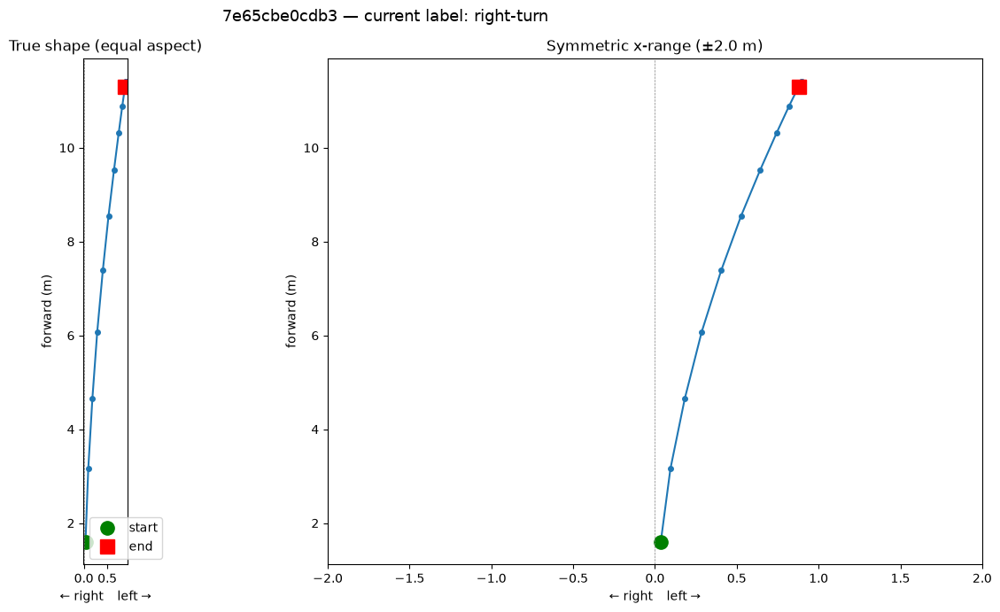

In [14]:
# --- Eyeball 7e65cbe0cd: 0.847m lateral / 9.70m forward, borderline case ---
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '../data/processed/waymo_e2e/training/'
target_seq = '7e65cbe0cd'   # prefix match

files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])
seq_frames = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_', 1)[0]
    if seq_id.startswith(target_seq):
        frame_idx = int(fname.rsplit('_', 1)[1].replace('.npz', ''))
        seq_frames[seq_id].append((frame_idx, fname))

seq_id = list(seq_frames.keys())[0]
frames = sorted(seq_frames[seq_id])
print(f'Sequence {seq_id}, {len(frames)} frames')

MANEUVER_RANK = {'left-turn': 5, 'right-turn': 5, 'lane-change-left': 4,
                 'lane-change-right': 4, 'straight': 3, 'stationary': 1}

# find the label-setting (best) frame, same logic as manifest
def cur_label(xs, ys):
    total_dist = np.sqrt((xs[-1]-xs[0])**2 + (ys[-1]-ys[0])**2)
    if total_dist < 2.0: return 'stationary'
    n=len(xs); mid=n//2
    dx1,dy1=xs[mid]-xs[0],ys[mid]-ys[0]; dx2,dy2=xs[-1]-xs[mid],ys[-1]-ys[mid]
    mag1=np.sqrt(dx1**2+dy1**2); mag2=np.sqrt(dx2**2+dy2**2)
    if mag1<0.1 or mag2<0.1: return 'stationary'
    cross=dx1*dy2-dy1*dx2; dot=dx1*dx2+dy1*dy2
    angle=np.arctan2(cross/(mag1*mag2), dot/(mag1*mag2))*180/np.pi
    if dot/(mag1*mag2) < -0.3: return 'left-turn' if ys[-1]>0 else 'right-turn'
    elif abs(angle)<8: return 'straight'
    elif abs(angle)<20: return 'lane-change-left' if angle>0 else 'lane-change-right'
    else: return 'left-turn' if angle>0 else 'right-turn'

best=None; best_rank=-1
for _, fname in frames:
    data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
    fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
    if fut.isEmpty: continue
    xs=fut.get(TrajectoryComponent.X).flatten(); ys=fut.get(TrajectoryComponent.Y).flatten()
    lab=cur_label(xs,ys)
    if MANEUVER_RANK[lab]>best_rank:
        best_rank=MANEUVER_RANK[lab]; best=(fname,xs,ys,lab)

fname, xs, ys, lab = best
lateral = ys[-1]-ys[0]; forward = xs[-1]-xs[0]
print(f'Best frame: {fname}')
print(f'  current label: {lab}')
print(f'  lateral disp: {lateral:+.3f} m,  forward disp: {forward:+.3f} m')
print(f'  ratio |lat|/fwd: {abs(lateral)/abs(forward):.3f}')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# left: equal aspect, true shape
ax1.plot(-ys, xs, '-o', ms=4)
ax1.plot(-ys[0], xs[0], 'go', ms=11, label='start')
ax1.plot(-ys[-1], xs[-1], 'rs', ms=11, label='end')
ax1.axvline(0, color='gray', lw=0.5, ls='--')
ax1.set_aspect('equal', 'box')
ax1.set_title('True shape (equal aspect)')
ax1.set_xlabel('← right    left →'); ax1.set_ylabel('forward (m)')
ax1.legend()

# right: symmetric x limits so lane-change vs turn is obvious
span = max(abs(ys).max(), 2.0)
ax2.plot(-ys, xs, '-o', ms=4)
ax2.plot(-ys[0], xs[0], 'go', ms=11); ax2.plot(-ys[-1], xs[-1], 'rs', ms=11)
ax2.axvline(0, color='gray', lw=0.5, ls='--')
ax2.set_xlim(-span, span)
ax2.set_title(f'Symmetric x-range (±{span:.1f} m)')
ax2.set_xlabel('← right    left →'); ax2.set_ylabel('forward (m)')

plt.suptitle(f'{seq_id[:12]} — current label: {lab}', fontsize=13)
plt.tight_layout()
plt.savefig('outputs/eyeball_7e65cbe0cd.png', dpi=140)
plt.show()

In [15]:
# --- Compare current vs branch-removed classifier (exploration only) ---
import numpy as np

def classify_CURRENT(xs, ys):
    """Current logic in build_train_manifest.py (with the sharp-turn branch)."""
    total_dist = np.sqrt((xs[-1]-xs[0])**2 + (ys[-1]-ys[0])**2)
    if total_dist < 2.0: return 'stationary'
    n=len(xs); mid=n//2
    dx1,dy1=xs[mid]-xs[0],ys[mid]-ys[0]; dx2,dy2=xs[-1]-xs[mid],ys[-1]-ys[mid]
    mag1=np.sqrt(dx1**2+dy1**2); mag2=np.sqrt(dx2**2+dy2**2)
    if mag1<0.1 or mag2<0.1: return 'stationary'
    cross=dx1*dy2-dy1*dx2; dot=dx1*dx2+dy1*dy2
    angle=np.arctan2(cross/(mag1*mag2), dot/(mag1*mag2))*180/np.pi
    if dot/(mag1*mag2) < -0.3: return 'left-turn' if ys[-1]>0 else 'right-turn'
    elif abs(angle)<8: return 'straight'
    elif abs(angle)<20: return 'lane-change-left' if angle>0 else 'lane-change-right'
    else: return 'left-turn' if angle>0 else 'right-turn'

def classify_PROPOSED(xs, ys):
    """Sharp-turn branch removed. Dataset contains no u-turns, so maneuvers
    are classified purely by signed heading change."""
    total_dist = np.sqrt((xs[-1]-xs[0])**2 + (ys[-1]-ys[0])**2)
    if total_dist < 2.0: return 'stationary'
    n=len(xs); mid=n//2
    dx1,dy1=xs[mid]-xs[0],ys[mid]-ys[0]; dx2,dy2=xs[-1]-xs[mid],ys[-1]-ys[mid]
    mag1=np.sqrt(dx1**2+dy1**2); mag2=np.sqrt(dx2**2+dy2**2)
    if mag1<0.1 or mag2<0.1: return 'stationary'
    cross=dx1*dy2-dy1*dx2; dot=dx1*dx2+dy1*dy2
    angle=np.arctan2(cross/(mag1*mag2), dot/(mag1*mag2))*180/np.pi
    if abs(angle)<8: return 'straight'
    elif abs(angle)<20: return 'lane-change-left' if angle>0 else 'lane-change-right'
    else: return 'left-turn' if angle>0 else 'right-turn'

print('Classifiers defined.')

Classifiers defined.


In [16]:
# --- Full-dataset comparison (slow: scans all frames) ---
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from collections import defaultdict, Counter
from standard_e2e import Modality, TrajectoryComponent

TRAIN_DIR = '../data/processed/waymo_e2e/training/'
files = sorted([f for f in os.listdir(TRAIN_DIR) if f.endswith('.npz')])
sequences = defaultdict(list)
for fname in files:
    seq_id = fname.rsplit('_',1)[0]
    idx = int(fname.rsplit('_',1)[1].replace('.npz',''))
    sequences[seq_id].append((idx, fname))
for sid in sequences: sequences[sid].sort()

RANK = {'left-turn':5,'right-turn':5,'lane-change-left':4,'lane-change-right':4,
        'straight':3,'stationary':1}

def best_label(frames, classifier):
    best=None; best_rank=-1
    for _, fname in frames:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten(); ys=fut.get(TrajectoryComponent.Y).flatten()
        lab=classifier(xs,ys)
        if RANK[lab]>best_rank: best_rank=RANK[lab]; best=lab
    return best

cur_labels={}; new_labels={}
for i,(sid,frames) in enumerate(sequences.items()):
    if (i+1)%200==0: print(f'  {i+1}/{len(sequences)}...')
    # load frames once, classify with both
    loaded=[]
    for _, fname in frames:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten(); ys=fut.get(TrajectoryComponent.Y).flatten()
        loaded.append((xs,ys))
    if not loaded: continue
    cb=cn=None; rb=rn=-1
    for xs,ys in loaded:
        lc=classify_CURRENT(xs,ys); ln=classify_PROPOSED(xs,ys)
        if RANK[lc]>rb: rb=RANK[lc]; cb=lc
        if RANK[ln]>rn: rn=RANK[ln]; cn=ln
    cur_labels[sid]=cb; new_labels[sid]=cn

print('\n=== CURRENT distribution ===')
cc=Counter(cur_labels.values()); tot=sum(cc.values())
for k,v in sorted(cc.items(), key=lambda x:-x[1]): print(f'  {k:<20} {v:>5} ({v/tot*100:.1f}%)')

print('\n=== PROPOSED distribution ===')
cn_=Counter(new_labels.values()); tot=sum(cn_.values())
for k,v in sorted(cn_.items(), key=lambda x:-x[1]): print(f'  {k:<20} {v:>5} ({v/tot*100:.1f}%)')

changed=[(s,cur_labels[s],new_labels[s]) for s in cur_labels if cur_labels[s]!=new_labels[s]]
print(f'\n=== {len(changed)} sequences change label ===')
for s,c,n in sorted(changed, key=lambda x:(x[1],x[2])):
    print(f'  {s[:12]}  {c:>16}  →  {n}')

  200/2037...
  400/2037...
  600/2037...
  800/2037...
  1000/2037...
  1200/2037...
  1400/2037...
  1600/2037...
  1800/2037...
  2000/2037...

=== CURRENT distribution ===
  straight               971 (47.7%)
  right-turn             477 (23.4%)
  left-turn              377 (18.5%)
  lane-change-right      110 (5.4%)
  lane-change-left        93 (4.6%)
  stationary               9 (0.4%)

=== PROPOSED distribution ===
  straight               971 (47.7%)
  right-turn             465 (22.8%)
  left-turn              389 (19.1%)
  lane-change-right      110 (5.4%)
  lane-change-left        93 (4.6%)
  stationary               9 (0.4%)

=== 26 sequences change label ===
  362df24f5966         left-turn  →  right-turn
  4f66c35b23a3         left-turn  →  right-turn
  57b398d4f28e         left-turn  →  right-turn
  9285ef829980         left-turn  →  right-turn
  d87ebc39f618         left-turn  →  right-turn
  dde512e476ca         left-turn  →  right-turn
  f658a3f4337a         left-turn

In [17]:
# --- Feature comparison on the 26 changing sequences ---
# For each, compute several candidate signals so we can see which one
# correctly separates turns from lane-changes/straight.
import numpy as np
from standard_e2e import Modality, TrajectoryComponent

CHANGED = ['362df24f59','4f66c35b23','57b398d4f2','9285ef8299','d87ebc39f6',
           'dde512e476','f658a3f43','0baab51294','0f6bdce169','29595e6da9',
           '2b75e328cf','3008bcb245','4a7e646a04','5944f95038','59735f607e',
           '5eeea0e74f','7e65cbe0cd','8babe36c1e','b445bc3004','b596db45aa',
           'c4d2a1c09c','c97cabae55','cc5d443029','f85ca14e9d','facd975a91',
           'feecefad9b']

def features(xs, ys):
    total_dist = np.sqrt((xs[-1]-xs[0])**2 + (ys[-1]-ys[0])**2)
    lateral = ys[-1] - ys[0]
    forward = xs[-1] - xs[0]
    ratio = abs(lateral) / (abs(forward) + 1e-9)

    # (A) half-vector angle (CURRENT feature)
    n=len(xs); mid=n//2
    dx1,dy1=xs[mid]-xs[0],ys[mid]-ys[0]; dx2,dy2=xs[-1]-xs[mid],ys[-1]-ys[mid]
    mag1=np.sqrt(dx1**2+dy1**2); mag2=np.sqrt(dx2**2+dy2**2)
    cross=dx1*dy2-dy1*dx2; dot=dx1*dx2+dy1*dy2
    half_angle = np.arctan2(cross/(mag1*mag2+1e-9), dot/(mag1*mag2+1e-9))*180/np.pi

    # (B) net heading change: direction of final motion vs initial motion,
    #     using endpoint-to-endpoint tangents over a few frames for stability
    k = max(1, n//5)
    init_dir  = np.array([xs[k]-xs[0], ys[k]-ys[0]])
    final_dir = np.array([xs[-1]-xs[-1-k], ys[-1]-ys[-1-k]])
    ia = np.arctan2(init_dir[1], init_dir[0])
    fa = np.arctan2(final_dir[1], final_dir[0])
    net_heading = np.degrees(np.arctan2(np.sin(fa-ia), np.cos(fa-ia)))

    # (C) total integrated heading change along the path (sum of per-step turns)
    dpos = np.diff(np.column_stack([xs, ys]), axis=0)
    seg_ang = np.arctan2(dpos[:,1], dpos[:,0])
    dtheta = np.diff(seg_ang)
    dtheta = np.arctan2(np.sin(dtheta), np.cos(dtheta))  # wrap
    integrated = np.degrees(dtheta.sum())

    return total_dist, lateral, forward, ratio, half_angle, net_heading, integrated

print(f'{"seq":<11}{"lat":>7}{"fwd":>7}{"ratio":>7}{"half°":>8}{"net°":>8}{"integ°":>8}  cur→new')
print('-'*82)
for tgt in CHANGED:
    sid = next((s for s in sequences if s.startswith(tgt)), None)
    if sid is None: continue
    # label-setting frame under CURRENT
    best=None; best_rank=-1
    for _, fname in sequences[sid]:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten(); ys=fut.get(TrajectoryComponent.Y).flatten()
        lab=classify_CURRENT(xs,ys)
        if RANK[lab]>best_rank: best_rank=RANK[lab]; best=(xs,ys,lab)
    xs,ys,cur=best
    td,lat,fwd,ratio,ha,net,integ = features(xs,ys)
    new = classify_PROPOSED(xs,ys)
    print(f'{tgt:<11}{lat:>7.2f}{fwd:>7.2f}{ratio:>7.3f}{ha:>8.1f}{net:>8.1f}{integ:>8.1f}  {cur[:5]}→{new[:5]}')

seq            lat    fwd  ratio   half°    net°  integ°  cur→new
----------------------------------------------------------------------------------
362df24f59    0.01   4.18  0.003  -180.0    90.2   360.4  left-→right
4f66c35b23    0.04   6.99  0.005  -176.3  -177.8  -179.1  left-→right
57b398d4f2    1.15   3.19  0.359  -159.1   -48.1   -60.8  left-→right
9285ef8299    0.06   4.40  0.015  -176.6  -177.9  -178.7  left-→right
d87ebc39f6    0.01   2.35  0.003  -179.3  -179.2   180.9  left-→right
dde512e476    0.00   4.29  0.001  -179.4  -170.8   181.4  left-→right
f658a3f43     1.27   1.72  0.735  -136.2  -134.8  -135.1  left-→right
0baab51294   -0.23   4.95  0.047   178.2   178.5   178.3  right→left-
0f6bdce169   -0.05   4.17  0.011   178.7   178.3  -543.2  right→left-
29595e6da9   -0.01   2.30  0.006   178.8   179.1   179.9  right→left-
2b75e328cf   -0.22  11.26  0.020   176.0   176.4   178.0  right→left-
3008bcb245   -0.01   2.25  0.005   179.4   177.6   174.8  right→left-
4a7e646a04 

In [18]:
# --- Raw trajectory array inspection ---
# Compare one clean noise case vs one real turn. Print the actual future
# waypoints to see whether the read is clean or scrambled.
import numpy as np
from standard_e2e import Modality, TrajectoryComponent

def dump_sequence(prefix, n_frames_to_show=3):
    sid = next(s for s in sequences if s.startswith(prefix))
    frames = sequences[sid]
    print('='*70)
    print(f'SEQUENCE {sid}  ({len(frames)} frames)')
    print('='*70)

    # find the label-setting (best) frame under current logic
    RANK = {'left-turn':5,'right-turn':5,'lane-change-left':4,
            'lane-change-right':4,'straight':3,'stationary':1}
    best=None; best_rank=-1
    for _, fname in frames:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten(); ys=fut.get(TrajectoryComponent.Y).flatten()
        lab=classify_CURRENT(xs,ys)
        if RANK[lab]>best_rank: best_rank=RANK[lab]; best=(fname,xs,ys)

    fname, xs, ys = best
    print(f'Label-setting frame: {fname}')
    print(f'Future trajectory length: {len(xs)} waypoints\n')

    print(f'{"i":>3}{"x (fwd)":>10}{"y (lat)":>10}{"dx":>9}{"dy":>9}')
    print('-'*41)
    for i in range(len(xs)):
        dx = xs[i]-xs[i-1] if i>0 else 0.0
        dy = ys[i]-ys[i-1] if i>0 else 0.0
        print(f'{i:>3}{xs[i]:>10.3f}{ys[i]:>10.3f}{dx:>9.3f}{dy:>9.3f}')

    # basic monotonicity / sanity checks
    dxs = np.diff(xs)
    print(f'\n  x range: [{xs.min():.2f}, {xs.max():.2f}]   y range: [{ys.min():.2f}, {ys.max():.2f}]')
    print(f'  x monotonic increasing? {np.all(dxs >= -1e-6)}')
    print(f'  # of x reversals (dx<0): {(dxs < -1e-6).sum()} / {len(dxs)}')
    print(f'  net: forward {xs[-1]-xs[0]:+.3f}m, lateral {ys[-1]-ys[0]:+.3f}m')
    print()

# one clean noise case (integ 180°, ratio 0.002) and one real turn
dump_sequence('feecefad9b')   # suspected straight / data artifact
dump_sequence('57b398d4f2')   # suspected real turn

SEQUENCE feecefad9b65b3edc8efc0a32dc7bc67  (199 frames)
Label-setting frame: feecefad9b65b3edc8efc0a32dc7bc67_220.npz
Future trajectory length: 20 waypoints

  i   x (fwd)   y (lat)       dx       dy
-----------------------------------------
  0     1.456    -0.003    0.000    0.000
  1     2.778    -0.005    1.323   -0.003
  2     3.953    -0.008    1.175   -0.003
  3     4.977    -0.010    1.024   -0.002
  4     5.843    -0.012    0.866   -0.002
  5     6.548    -0.014    0.705   -0.001
  6     7.102    -0.015    0.554   -0.001
  7     7.504    -0.016    0.402   -0.001
  8     7.774    -0.017    0.270   -0.001
  9     7.920    -0.017    0.147   -0.000
 10     7.963    -0.017    0.042    0.000
 11     7.943    -0.016   -0.020    0.000
 12     7.944    -0.016    0.001    0.000
 13     7.940    -0.016   -0.003    0.000
 14     7.938    -0.016   -0.003    0.000
 15     7.936    -0.016   -0.001    0.000
 16     7.934    -0.016   -0.002   -0.000
 17     7.924    -0.016   -0.010    0.000
 1

In [19]:
# --- Full scan: net-displacement classifier vs current labels ---
# Quantifies the true scope of label changes (not just left<->right flips).
import os, numpy as np
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from collections import defaultdict, Counter
from standard_e2e import Modality, TrajectoryComponent

RANK = {'left-turn':5,'right-turn':5,'lane-change-left':4,'lane-change-right':4,
        'straight':3,'stationary':1}

def classify_by_net_displacement(xs, ys):
    lateral = ys[-1]-ys[0]; forward = xs[-1]-xs[0]
    total_dist = np.sqrt(lateral**2 + forward**2)
    if total_dist < 2.0: return 'stationary'
    n=len(xs); third=max(1,n//3)
    fwd_vec=np.array([xs[third]-xs[0], ys[third]-ys[0]])
    end_vec=np.array([xs[-1]-xs[-1-third], ys[-1]-ys[-1-third]])
    if np.linalg.norm(fwd_vec)<0.3 or np.linalg.norm(end_vec)<0.3:
        heading=0.0
    else:
        a0=np.arctan2(fwd_vec[1],fwd_vec[0]); a1=np.arctan2(end_vec[1],end_vec[0])
        heading=np.degrees(np.arctan2(np.sin(a1-a0),np.cos(a1-a0)))
    ratio=abs(lateral)/(abs(forward)+1e-9)
    if abs(heading)>20 or ratio>0.30:
        return 'left-turn' if lateral>0 else 'right-turn'
    elif ratio>0.08:
        return 'lane-change-left' if lateral>0 else 'lane-change-right'
    else:
        return 'straight'

cur_labels={}; new_labels={}
for i,(sid,frames) in enumerate(sequences.items()):
    if (i+1)%300==0: print(f'  {i+1}/{len(sequences)}...')
    cb=cn=None; rb=rn=-1
    for _, fname in frames:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten(); ys=fut.get(TrajectoryComponent.Y).flatten()
        lc=classify_CURRENT(xs,ys); ln=classify_by_net_displacement(xs,ys)
        if RANK[lc]>rb: rb=RANK[lc]; cb=lc
        if RANK[ln]>rn: rn=RANK[ln]; cn=ln
    if cb: cur_labels[sid]=cb
    if cn: new_labels[sid]=cn

print('\n=== CURRENT ===')
c=Counter(cur_labels.values()); t=sum(c.values())
for k,v in sorted(c.items(),key=lambda x:-x[1]): print(f'  {k:<20}{v:>5} ({v/t*100:.1f}%)')
print('\n=== NET-DISPLACEMENT ===')
c=Counter(new_labels.values()); t=sum(c.values())
for k,v in sorted(c.items(),key=lambda x:-x[1]): print(f'  {k:<20}{v:>5} ({v/t*100:.1f}%)')

changed=[(s,cur_labels[s],new_labels[s]) for s in cur_labels if cur_labels.get(s)!=new_labels.get(s)]
print(f'\n=== {len(changed)} of {len(cur_labels)} sequences change ({len(changed)/len(cur_labels)*100:.1f}%) ===')
trans=Counter((c,n) for _,c,n in changed)
print('\nTransition counts:')
for (c,n),cnt in sorted(trans.items(),key=lambda x:-x[1]):
    print(f'  {c:<18} → {n:<18} {cnt}')

  300/2037...
  600/2037...
  900/2037...
  1200/2037...
  1500/2037...
  1800/2037...

=== CURRENT ===
  straight              971 (47.7%)
  right-turn            477 (23.4%)
  left-turn             377 (18.5%)
  lane-change-right     110 (5.4%)
  lane-change-left       93 (4.6%)
  stationary              9 (0.4%)

=== NET-DISPLACEMENT ===
  straight              758 (37.2%)
  right-turn            499 (24.5%)
  left-turn             431 (21.2%)
  lane-change-right     174 (8.5%)
  lane-change-left      166 (8.1%)
  stationary              9 (0.4%)

=== 388 of 2037 sequences change (19.0%) ===

Transition counts:
  straight           → lane-change-right  119
  straight           → lane-change-left   94
  lane-change-left   → left-turn          35
  right-turn         → left-turn          27
  lane-change-right  → right-turn         27
  left-turn          → right-turn         18
  lane-change-right  → lane-change-left   17
  lane-change-right  → left-turn          14
  straight       

In [20]:
# --- Inspect available TrajectoryComponents + heading availability ---
import os, numpy as np
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from standard_e2e import Modality, TrajectoryComponent

# 1. What TrajectoryComponents exist?
print("Available TrajectoryComponent members:")
for name in dir(TrajectoryComponent):
    if not name.startswith('_'):
        print(f"  {name}")
print()

# 2. Grab one sequence's future states and see what components return data
sid = next(iter(sequences))
_, fname = sequences[sid][len(sequences[sid])//2]
data = np.load(os.path.join(TRAIN_DIR, fname), allow_pickle=True)
modality = data['_modality_data'].item()
future = modality[Modality.FUTURE_STATES]

print(f"Sample frame: {fname}")
print(f"future.isEmpty: {future.isEmpty}\n")

# try each component, report shape or failure
for name in dir(TrajectoryComponent):
    if name.startswith('_'):
        continue
    try:
        comp = getattr(TrajectoryComponent, name)
        vals = future.get(comp)
        arr = np.array(vals).flatten()
        print(f"  {name:<22} shape={np.array(vals).shape}  first3={arr[:3]}")
    except Exception as e:
        print(f"  {name:<22} -> {type(e).__name__}: {str(e)[:40]}")

Available TrajectoryComponent members:
  ACCELERATION_X
  ACCELERATION_Y
  HEADING
  HEIGHT
  IS_VALID
  LENGTH
  SPEED
  TIMESTAMP
  VELOCITY_X
  VELOCITY_Y
  WIDTH
  X
  Y
  Z
  capitalize
  casefold
  center
  count
  encode
  endswith
  expandtabs
  find
  format
  format_map
  index
  isalnum
  isalpha
  isascii
  isdecimal
  isdigit
  isidentifier
  islower
  isnumeric
  isprintable
  isspace
  istitle
  isupper
  join
  ljust
  lower
  lstrip
  maketrans
  partition
  removeprefix
  removesuffix
  replace
  rfind
  rindex
  rjust
  rpartition
  rsplit
  rstrip
  split
  splitlines
  startswith
  strip
  swapcase
  title
  translate
  upper
  zfill

Sample frame: 003b62820d0e9345eb025de35b046999_123.npz
future.isEmpty: False

  ACCELERATION_X         -> KeyError: 'Missing component(s): ACCELERATION_X. A
  ACCELERATION_Y         -> KeyError: 'Missing component(s): ACCELERATION_Y. A
  HEADING                -> KeyError: 'Missing component(s): HEADING. Availabl
  HEIGHT             

In [22]:
# --- Waymo ClassifyTrack, ported to X/Y trajectories (heading/velocity reconstructed) ---
# Faithful to waymo_open_dataset/metrics/motion_metrics_utils.cc ClassifyTrack,
# with heading_diff and max_speed derived from X/Y/TIMESTAMP because the future
# states do not populate HEADING or VELOCITY. Thresholds are Waymo's originals.
import numpy as np

# Waymo's thresholds (from motion_metrics_utils.cc)
MAX_SPEED_FOR_STATIONARY = 2.0            # m/s
MAX_DISPLACEMENT_FOR_STATIONARY = 3.0     # m
MAX_LATERAL_DISPLACEMENT_FOR_STRAIGHT = 2.5   # m
MIN_LONGITUDINAL_DISPLACEMENT_FOR_UTURN = 0.0 # m
MAX_ABS_HEADING_DIFF_FOR_STRAIGHT = np.pi / 6.0  # 30 degrees, in radians

# The one parameter not from Waymo: minimum segment displacement (m) required
# before a motion direction is trusted as a heading. Guards against stationary
# jitter producing garbage headings (the failure mode of the old classifier).
MIN_DISP_FOR_HEADING = 0.5  # m

def _heading_from_ends(xs, ys):
    """Start and end heading via displacement-gated tangents.
    Returns (start_heading, end_heading) in radians, or (None, None) if the
    trajectory never moves enough to define a direction."""
    pts = np.column_stack([xs, ys])

    # start heading: first point that is >= MIN_DISP from pts[0]
    start_h = None
    for i in range(1, len(pts)):
        d = np.hypot(*(pts[i] - pts[0]))
        if d >= MIN_DISP_FOR_HEADING:
            start_h = np.arctan2(pts[i][1] - pts[0][1], pts[i][0] - pts[0][0])
            break

    # end heading: last point that is >= MIN_DISP from pts[-1]
    end_h = None
    for i in range(len(pts) - 2, -1, -1):
        d = np.hypot(*(pts[-1] - pts[i]))
        if d >= MIN_DISP_FOR_HEADING:
            end_h = np.arctan2(pts[-1][1] - pts[i][1], pts[-1][0] - pts[i][0])
            break

    return start_h, end_h

def _max_speed(xs, ys, ts):
    """Max instantaneous speed (m/s) from consecutive X/Y and TIMESTAMP."""
    pts = np.column_stack([xs, ys])
    dt = np.diff(ts.flatten())
    seg = np.hypot(*(np.diff(pts, axis=0).T))
    dt = np.where(dt <= 0, np.nan, dt)
    v = seg / dt
    return np.nanmax(v) if len(v) else 0.0

def classify_waymo(xs, ys, ts):
    """Port of Waymo ClassifyTrack. Returns one of:
    'stationary','straight','lane-change-left','lane-change-right',
    'left-turn','right-turn','left-u-turn','right-u-turn'.
    Trajectory is ego-relative (origin at start, x forward, y left)."""
    xs = np.asarray(xs).flatten(); ys = np.asarray(ys).flatten()
    dx = xs[-1] - xs[0]
    dy = ys[-1] - ys[0]
    final_displacement = np.hypot(dx, dy)
    max_speed = _max_speed(xs, ys, ts)

    # stationary
    if max_speed < MAX_SPEED_FOR_STATIONARY and \
       final_displacement < MAX_DISPLACEMENT_FOR_STATIONARY:
        return 'stationary'

    start_h, end_h = _heading_from_ends(xs, ys)
    if start_h is None or end_h is None:
        # moved far enough to not be stationary, but no stable heading pair:
        # fall back on lateral displacement only.
        heading_diff = 0.0
    else:
        heading_diff = np.arctan2(np.sin(end_h - start_h), np.cos(end_h - start_h))

    # straight-ish
    if abs(heading_diff) < MAX_ABS_HEADING_DIFF_FOR_STRAIGHT:
        if abs(dy) < MAX_LATERAL_DISPLACEMENT_FOR_STRAIGHT:
            return 'straight'
        return 'lane-change-right' if dy < 0 else 'lane-change-left'

    # turning
    if dy < 0:
        return 'right-u-turn' if dx < MIN_LONGITUDINAL_DISPLACEMENT_FOR_UTURN else 'right-turn'
    if dx < MIN_LONGITUDINAL_DISPLACEMENT_FOR_UTURN:
        return 'left-u-turn'
    return 'left-turn'

In [23]:
# --- Full scan: Waymo-ported classifier vs current labels ---
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from collections import defaultdict, Counter
from standard_e2e import Modality, TrajectoryComponent

# rank for picking the sequence-level (best) maneuver frame.
# note: u-turns included so they'd surface if present.
RANK = {'left-u-turn':6,'right-u-turn':6,'left-turn':5,'right-turn':5,
        'lane-change-left':4,'lane-change-right':4,'straight':3,'stationary':1}

new_labels = {}
uturn_hits = []
for i,(sid,frames) in enumerate(sequences.items()):
    if (i+1)%300==0: print(f'  {i+1}/{len(sequences)}...')
    best=None; best_rank=-1
    for _, fname in frames:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten()
        ys=fut.get(TrajectoryComponent.Y).flatten()
        ts=fut.get(TrajectoryComponent.TIMESTAMP)
        lab=classify_waymo(xs,ys,ts)
        if RANK[lab]>best_rank: best_rank=RANK[lab]; best=lab
    if best:
        new_labels[sid]=best
        if 'u-turn' in best:
            uturn_hits.append(sid)

print('\n=== WAYMO-PORTED distribution ===')
c=Counter(new_labels.values()); t=sum(c.values())
for k,v in sorted(c.items(),key=lambda x:-x[1]):
    print(f'  {k:<20}{v:>5} ({v/t*100:.1f}%)')

print(f'\nU-turn sequences: {len(uturn_hits)}')
if uturn_hits:
    print('  ', uturn_hits[:10])

# compare to current labels if available from earlier cell
try:
    changed=[(s,cur_labels[s],new_labels[s]) for s in cur_labels
             if s in new_labels and cur_labels[s]!=new_labels[s]]
    print(f'\n=== {len(changed)} of {len(cur_labels)} change '
          f'({len(changed)/len(cur_labels)*100:.1f}%) ===')
    trans=Counter((c,n) for _,c,n in changed)
    for (cc,nn),cnt in sorted(trans.items(),key=lambda x:-x[1]):
        print(f'  {cc:<18} → {nn:<18} {cnt}')
except NameError:
    print('\n(cur_labels not in memory - skipping diff)')

  300/2037...
  600/2037...
  900/2037...
  1200/2037...
  1500/2037...
  1800/2037...

=== WAYMO-PORTED distribution ===
  straight              745 (36.6%)
  right-turn            463 (22.7%)
  left-turn             384 (18.9%)
  lane-change-right     222 (10.9%)
  lane-change-left      200 (9.8%)
  stationary             11 (0.5%)
  left-u-turn             8 (0.4%)
  right-u-turn            4 (0.2%)

U-turn sequences: 12
   ['1ab9a2ce575019750c83ea71a7124f78', '203edf7e1f4a845dba5e094283bc619c', '23f709721e947abbce80b1f972ae2e34', '276512cd80c65fed48986b6a892b672e', '42b65e43c0248e89c2909b6ad2b37969', '47e3d70005cb1e8a7ec489b28b55ba8b', '4c09b7229c12a3e7984c0fbbf6276d0c', '6c7431d34c6773ef83e31d1938e2a256', '7deb1648e456eb96124b1d41c18409cc', '84703b69db5a8dbe4b9e7ac1508ea443']

=== 428 of 2037 change (21.0%) ===
  straight           → lane-change-right  159
  straight           → lane-change-left   110
  lane-change-right  → lane-change-left   23
  lane-change-right  → straight    

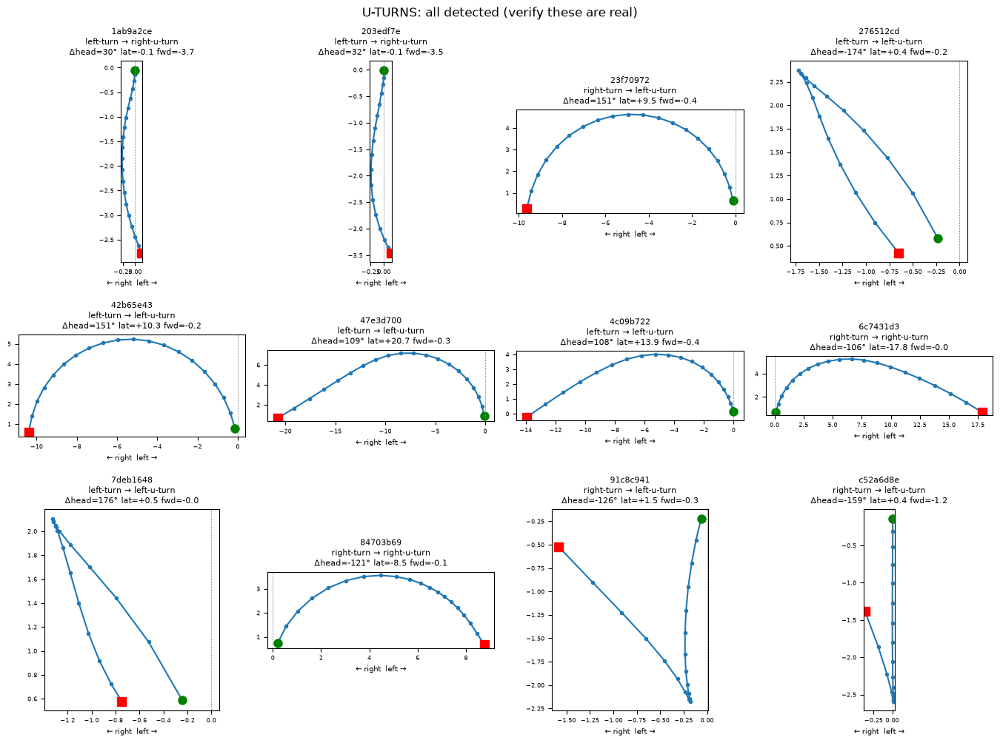

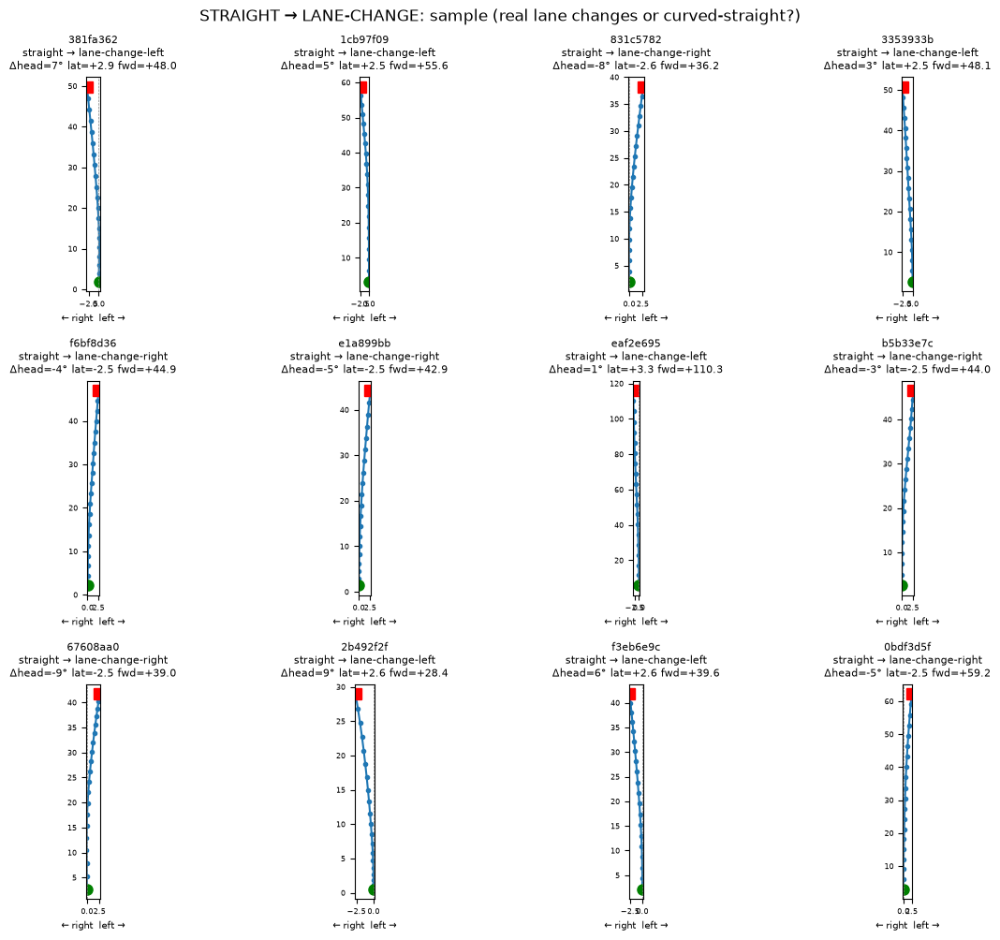

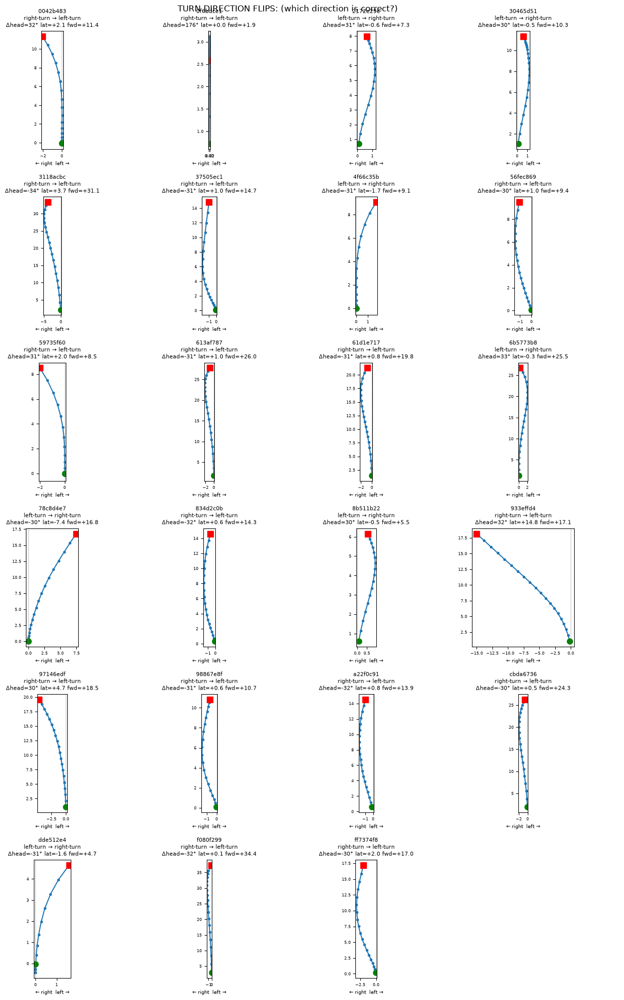

In [24]:
# --- Validation plots: verify the Waymo-ported labels on the contested cases ---
import os, numpy as np
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import matplotlib.pyplot as plt
from standard_e2e import Modality, TrajectoryComponent

RANK = {'left-u-turn':6,'right-u-turn':6,'left-turn':5,'right-turn':5,
        'lane-change-left':4,'lane-change-right':4,'straight':3,'stationary':1}

def best_frame_traj(sid):
    """Return (xs, ys, ts, label) for the sequence-level best frame under classify_waymo."""
    best=None; best_rank=-1
    for _, fname in sequences[sid]:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten()
        ys=fut.get(TrajectoryComponent.Y).flatten()
        ts=fut.get(TrajectoryComponent.TIMESTAMP)
        lab=classify_waymo(xs,ys,ts)
        if RANK[lab]>best_rank:
            best_rank=RANK[lab]; best=(xs,ys,ts,lab)
    return best

def plot_group(sids, title, ncols=4):
    n=len(sids)
    if n==0:
        print(f'({title}: none)'); return
    nrows=(n+ncols-1)//ncols
    fig,axes=plt.subplots(nrows,ncols,figsize=(ncols*3.4,nrows*3.4))
    axes=np.atleast_1d(axes).flatten()
    for ax,sid in zip(axes,sids):
        xs,ys,ts,lab=best_frame_traj(sid)
        dx,dy=xs[-1]-xs[0], ys[-1]-ys[0]
        sh,eh=_heading_from_ends(xs,ys)
        if sh is None or eh is None:
            hd=0.0
        else:
            hd=np.degrees(np.arctan2(np.sin(eh-sh),np.cos(eh-sh)))
        ax.plot(-ys,xs,'-o',ms=3)
        ax.plot(-ys[0],xs[0],'go',ms=8); ax.plot(-ys[-1],xs[-1],'rs',ms=8)
        ax.axvline(0,color='gray',lw=0.5,ls='--')
        ax.set_aspect('equal','box')
        cur = cur_labels.get(sid,'?')
        ax.set_title(f'{sid[:8]}\n{cur} → {lab}\nΔhead={hd:.0f}° lat={dy:+.1f} fwd={dx:+.1f}',
                     fontsize=8)
        ax.set_xlabel('← right  left →',fontsize=7)
        ax.tick_params(labelsize=6)
    for ax in axes[len(sids):]: ax.axis('off')
    plt.suptitle(title,fontsize=12)
    plt.tight_layout()
    fname_out=f'outputs/validate_{title.split()[0].lower().replace(":","")}.png'
    plt.savefig(fname_out,dpi=120)
    plt.show()

# 1. ALL u-turns (the sharpest surprise)
uturns=[s for s in new_labels if 'u-turn' in new_labels[s]]
plot_group(uturns, 'U-TURNS: all detected (verify these are real)')

# 2. straight -> lane-change sample (the dominant transition)
s2lc=[s for s in cur_labels if cur_labels[s]=='straight'
      and new_labels.get(s) in ('lane-change-left','lane-change-right')]
import random; random.seed(1)
plot_group(random.sample(s2lc, min(12,len(s2lc))),
           'STRAIGHT → LANE-CHANGE: sample (real lane changes or curved-straight?)')

# 3. turn <-> turn flips
flips=[s for s in cur_labels if cur_labels[s] in ('left-turn','right-turn')
       and new_labels.get(s) in ('left-turn','right-turn')
       and cur_labels[s]!=new_labels[s]]
plot_group(flips, 'TURN DIRECTION FLIPS: (which direction is correct?)')

Showing 5 straight->lane-change filmstrips


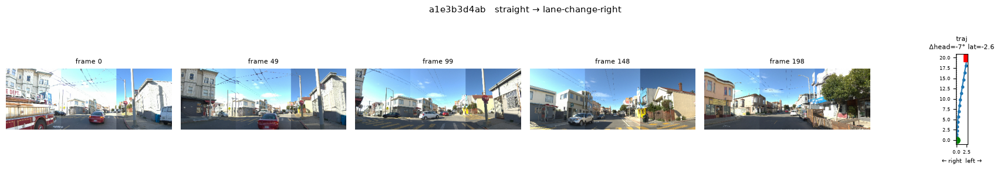

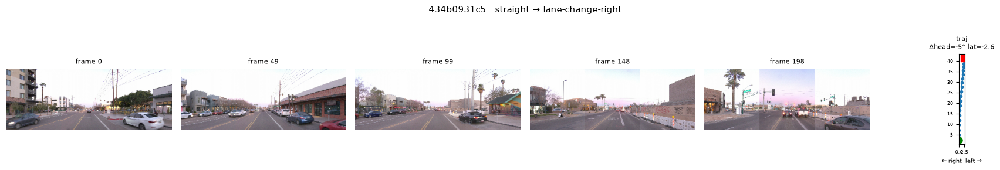

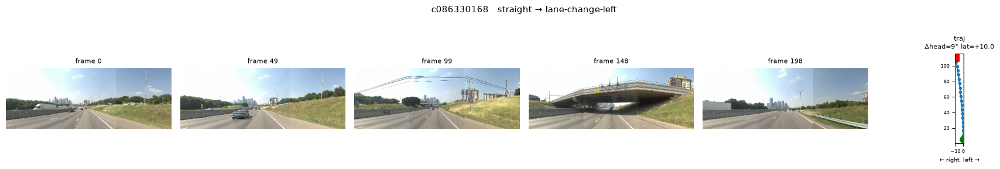

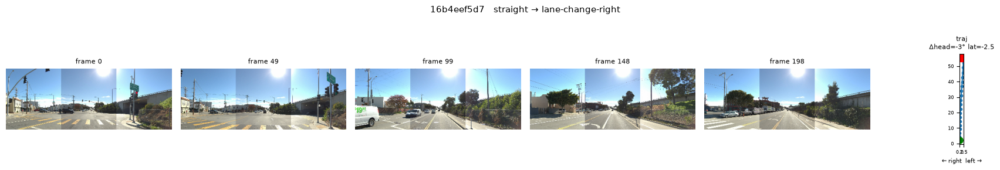

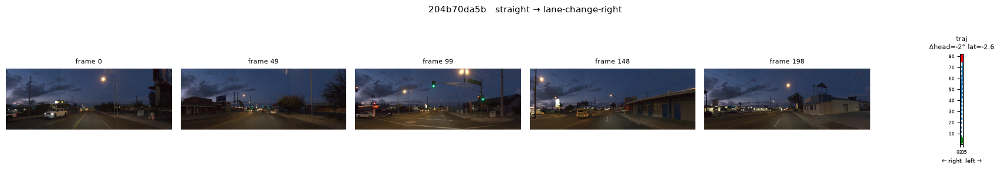

In [25]:
# --- Filmstrip + trajectory for contested straight->lane-change cases ---
import os, numpy as np
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
import matplotlib.pyplot as plt
from standard_e2e import Modality, TrajectoryComponent

RANK = {'left-turn':5,'right-turn':5,'lane-change-left':4,
        'lane-change-right':4,'straight':3,'stationary':1}

def best_frame_fname(sid):
    """Return (fname, xs, ys, ts, label) for the sequence-level best frame."""
    best=None; best_rank=-1
    for _, fname in sequences[sid]:
        data=np.load(os.path.join(TRAIN_DIR,fname),allow_pickle=True)
        fut=data['_modality_data'].item()[Modality.FUTURE_STATES]
        if fut.isEmpty: continue
        xs=fut.get(TrajectoryComponent.X).flatten()
        ys=fut.get(TrajectoryComponent.Y).flatten()
        ts=fut.get(TrajectoryComponent.TIMESTAMP)
        lab=classify_waymo(xs,ys,ts)
        if RANK[lab]>best_rank:
            best_rank=RANK[lab]; best=(fname,xs,ys,ts,lab)
    return best

def filmstrip_row(sid, n_frames=5):
    """One figure row: N sampled camera frames + the trajectory plot."""
    # gather this sequence's frames in order
    frames = sequences[sid]  # list of (idx, fname), already sorted
    best = best_frame_fname(sid)
    fname, xs, ys, ts, lab = best
    dy = ys[-1]-ys[0]; dx = xs[-1]-xs[0]
    sh,eh=_heading_from_ends(xs,ys)
    hd = 0.0 if (sh is None or eh is None) else np.degrees(np.arctan2(np.sin(eh-sh),np.cos(eh-sh)))

    # evenly sample n_frames across the sequence for the filmstrip
    idxs = np.linspace(0, len(frames)-1, n_frames).astype(int)
    fig, axes = plt.subplots(1, n_frames+1, figsize=((n_frames+1)*3.0, 2.8))
    for j, fi in enumerate(idxs):
        _, ff = frames[fi]
        d = np.load(os.path.join(TRAIN_DIR, ff), allow_pickle=True)
        img = np.array(d['_modality_data'].item()[Modality.CAMERAS])
        axes[j].imshow(img)
        axes[j].set_title(f'frame {fi}', fontsize=8)
        axes[j].axis('off')
    # trajectory in the last panel
    ax = axes[-1]
    ax.plot(-ys, xs, '-o', ms=3)
    ax.plot(-ys[0], xs[0], 'go', ms=8); ax.plot(-ys[-1], xs[-1], 'rs', ms=8)
    ax.axvline(0, color='gray', lw=0.5, ls='--')
    ax.set_aspect('equal','box')
    ax.set_title(f'traj\nΔhead={hd:.0f}° lat={dy:+.1f}', fontsize=8)
    ax.set_xlabel('← right  left →', fontsize=7); ax.tick_params(labelsize=6)

    cur = cur_labels.get(sid,'?')
    fig.suptitle(f'{sid[:10]}   {cur} → {lab}', fontsize=11, y=1.02)
    plt.tight_layout()
    plt.savefig(f'outputs/filmstrip_{sid[:8]}.png', dpi=110, bbox_inches='tight')
    plt.show()

# pick a handful of straight -> lane-change cases to confirm visually
s2lc = [s for s in cur_labels if cur_labels[s]=='straight'
        and new_labels.get(s) in ('lane-change-left','lane-change-right')]
import random; random.seed(7)
sample = random.sample(s2lc, min(5, len(s2lc)))
print(f'Showing {len(sample)} straight->lane-change filmstrips')
for sid in sample:
    filmstrip_row(sid)

In [28]:
import json
m = json.load(open('../data/train_manifest.json'))
n1 = [k for k,v in m.items() if v['n_context'] == 1]
print(f'{len(n1)} sequences with n_context=1')

5 sequences with n_context=1
